In [181]:
import os
import pickle
import jieba
import operator
import statistics
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from datetime import datetime
from collections import Counter

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

from news_model import *

font_path = '../tools/msjh.ttc'
font = font_manager.FontProperties(fname='../tools/msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)

In [106]:
with open('../crawler/data/newhead_news.pkl', 'rb') as f:
    data = pickle.load(f)
    
data = data[::-1]
contents = [news['content'] for news in data]

In [108]:
get_coshow(contents[:1000])[:10]

[('68', 100),
 ('麵包', 97),
 ('8延伸閱讀', 41),
 ('的麵', 32),
 ('今（', 30),
 ('包師傅', 30),
 ('）日', 28),
 ('的是', 28),
 ('我的', 28),
 ('都是', 28)]

In [109]:
jieba.set_dictionary('../jieba_data/dict.txt.big')
jieba.load_userdict('../jieba_data/userdict.txt')
stopwords = []
with open('../jieba_data/stopwords.txt', 'r', encoding='UTF-8') as file:
    for each in file.readlines():
        stopwords.append(each.strip())
    stopwords.append(' ')

Building prefix dict from C:\Users\GIGABYTE\fin_class\jieba_data\dict.txt.big ...
Loading model from cache C:\Users\GIGABYTE\AppData\Local\Temp\jieba.u76dcdccef8b36c29aab3e633e439e35d.cache
Loading model cost 1.674 seconds.
Prefix dict has been built succesfully.


In [110]:
# add cutted dict to each news
for i in range(len(data)):
    current_content = data[i]['content']
    current_cutted = jieba.lcut(remove_punctuation(current_content))
    data[i]['cutted_dict'] = lcut_to_dict(current_cutted)

In [111]:
get_coshow(contents[:1000])[:10]

[('68', 100),
 ('麵包', 97),
 ('8延伸閱讀', 41),
 ('的麵', 32),
 ('今（', 30),
 ('包師傅', 30),
 ('）日', 28),
 ('的是', 28),
 ('我的', 28),
 ('都是', 28)]

In [112]:
cutted_dict = get_cutted_dict(contents[:1000])
high_freq_pair = first_n_words(cutted_dict, 20)
high_freq_pair

[('民進黨', 1138),
 ('台灣', 1068),
 ('韓國瑜', 684),
 ('柯文哲', 661),
 ('媒體', 637),
 ('希望', 591),
 ('國民黨', 588),
 ('一個', 482),
 ('指出', 478),
 ('中國', 469),
 ('市長', 457),
 ('蔡英文', 440),
 ('高雄', 417),
 ('總統', 409),
 ('未來', 399),
 ('臉書', 385),
 ('市府', 384),
 ('選舉', 372),
 ('政治', 358),
 ('局長', 358)]

In [113]:
cutted_dict = get_cutted_dict(contents)

In [114]:
# 可能人名
possible_name = first_n_words(cutted_dict, 1000, 3, 3)
possible_name[:40]

[('民進黨', 3399),
 ('柯文哲', 2880),
 ('韓國瑜', 2847),
 ('國民黨', 2705),
 ('蔡英文', 2136),
 ('蘇貞昌', 1238),
 ('行政院', 1058),
 ('賴清德', 983),
 ('王金平', 923),
 ('吳敦義', 916),
 ('卓榮泰', 826),
 ('馬英九', 795),
 ('陳思宇', 788),
 ('朱立倫', 776),
 ('立法院', 736),
 ('候選人', 716),
 ('習近平', 693),
 ('記者會', 632),
 ('黨主席', 627),
 ('蔡總統', 600),
 ('管中閔', 588),
 ('陳其邁', 569),
 ('高雄市', 565),
 ('游盈隆', 553),
 ('黃國昌', 546),
 ('何志偉', 518),
 ('林佳龍', 508),
 ('總統府', 507),
 ('台北市', 499),
 ('委員會', 446),
 ('鄭文燦', 418),
 ('外交部', 417),
 ('新北市', 400),
 ('促轉會', 387),
 ('教育部', 378),
 ('鄭麗君', 376),
 ('交通部', 356),
 ('陳水扁', 351),
 ('12月', 347),
 ('基金會', 340)]

In [115]:
for i in possible_name[:40] :
    print(i[0])

民進黨
柯文哲
韓國瑜
國民黨
蔡英文
蘇貞昌
行政院
賴清德
王金平
吳敦義
卓榮泰
馬英九
陳思宇
朱立倫
立法院
候選人
習近平
記者會
黨主席
蔡總統
管中閔
陳其邁
高雄市
游盈隆
黃國昌
何志偉
林佳龍
總統府
台北市
委員會
鄭文燦
外交部
新北市
促轉會
教育部
鄭麗君
交通部
陳水扁
12月
基金會


In [116]:
# 可能事件
possible_events = first_n_words(cutted_dict, 200, 4)
possible_events[:40]

[('九二共識', 896),
 ('立委補選', 834),
 ('總統蔡英文', 709),
 ('2020', 649),
 ('高雄市長韓國瑜', 599),
 ('台北市長柯文哲', 540),
 ('中華民國', 464),
 ('一國兩制', 456),
 ('時代力量', 441),
 ('兩岸關係', 372),
 ('轉型正義', 364),
 ('蔡英文總統', 355),
 ('台灣人民', 333),
 ('兩岸一家親', 280),
 ('行政院長蘇貞昌', 278),
 ('政治人物', 275),
 ('行政院長', 274),
 ('民進黨立委', 263),
 ('非洲豬瘟', 260),
 ('九合一選舉', 245),
 ('行政院長賴清德', 245),
 ('高雄市政府', 239),
 ('2018年', 238),
 ('中正紀念堂', 233),
 ('台大校長', 228),
 ('2020總統', 227),
 ('總統初選', 225),
 ('前總統馬英九', 225),
 ('2019年', 220),
 ('參選總統', 220),
 ('民進黨主席', 213),
 ('2020總統大選', 208),
 ('就職典禮', 198),
 ('2020年', 194),
 ('總統大選', 188),
 ('兩岸和平', 187),
 ('國民黨主席吳敦義', 184),
 ('2016年', 182),
 ('雙城論壇', 182),
 ('新北市長朱立倫', 180)]

In [117]:
for i in possible_events[:40] :
    print(i[0])

九二共識
立委補選
總統蔡英文
2020
高雄市長韓國瑜
台北市長柯文哲
中華民國
一國兩制
時代力量
兩岸關係
轉型正義
蔡英文總統
台灣人民
兩岸一家親
行政院長蘇貞昌
政治人物
行政院長
民進黨立委
非洲豬瘟
九合一選舉
行政院長賴清德
高雄市政府
2018年
中正紀念堂
台大校長
2020總統
總統初選
前總統馬英九
2019年
參選總統
民進黨主席
2020總統大選
就職典禮
2020年
總統大選
兩岸和平
國民黨主席吳敦義
2016年
雙城論壇
新北市長朱立倫


In [118]:
names = []
with open('../data/names.txt', 'r', encoding='utf-8-sig') as f:
    names = f.read().split('\n')
    
events = []
with open('../data/events.txt', 'r', encoding='utf-8-sig') as f:
    events = f.read().split('\n')

In [119]:
print(' '.join(names[:5]))
print(' '.join(events[:5]))

民進黨 柯文哲 韓國瑜 國民黨 蔡英文
九二共識 立委補選 總統蔡英文 2020 高雄市長韓國瑜


25431


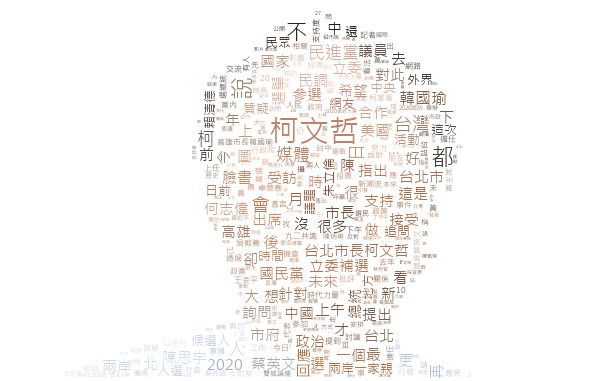

In [120]:
# 柯文哲
kp_wc = get_wordcloud_of_keywords('柯文哲', contents, image_path='../politicians/kp.png')
# kp_wc.to_file('politicians/kpwc.png')
kp_wc.to_image()

In [121]:
news_containing_kp = news_containing_keyword('柯文哲', contents)
kp_dict = get_cutted_dict(news_containing_kp)
first_n_words(kp_dict, 5)

[('柯文哲', 2880), ('台灣', 1058), ('媒體', 928), ('民進黨', 877), ('韓國瑜', 771)]

In [122]:
date_list = [news['date'] for news in data]
all_date = sorted(list(set(date_list)))
aall_date = [date[5:] for date in all_date][::-1]
date_index = [date_list.index(each_date) for each_date in all_date]
date_index.append(len(date_list)-1)
number_of_news = [date_index[i+1] - date_index[i]-1 for i in range(len(date_index)-1)]
number_of_terms = [sum([sum(data[ni]['cutted_dict'].values()) for ni in range(date_index[i], date_index[i+1])]) for i in range(len(date_index)-1)]

In [125]:
# 每日詞數
wn_by_day = {}
for i in range(len(date_index)-1):
#     print(date_index[i+1])
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict)
#     print(all_date[i])
    wn_by_day[all_date[i]] = current_word_dict

In [126]:
wn_by_day

{'2018-12-11': {'民主政治': 1.0,
  '突破': 5.0,
  '海峽交流基金會': 1.0,
  '店中': 1.0,
  '獻唱': 1.0,
  '具': 1.0,
  '鄭文燦': 7.0,
  '不再': 4.0,
  '嶄新': 1.0,
  '法令': 3.0,
  '失靈': 1.0,
  '3800': 2.0,
  '評社': 1.0,
  '交通部': 5.0,
  '更大': 2.0,
  '擴展': 1.0,
  '不認': 1.0,
  '漂亮': 1.0,
  '研究員': 1.0,
  '蔡英文': 7.0,
  '效應': 2.0,
  '想法': 3.0,
  '推人': 1.0,
  '榮譽': 1.0,
  '賽': 1.0,
  '早': 2.0,
  '包賣': 1.0,
  '遠傳': 1.0,
  '站': 2.0,
  '弄假成真': 1.0,
  '協調': 3.0,
  '民粹': 2.0,
  '恐怖份子': 1.0,
  '外縣市': 1.0,
  '一口': 1.0,
  '想': 4.0,
  '套上': 1.0,
  '列為': 1.0,
  '傻': 1.0,
  '真愛': 1.0,
  '合乎': 1.0,
  '職銜': 1.0,
  '一次次': 1.0,
  '嘉義': 1.0,
  '3254': 1.0,
  '子彈': 1.0,
  '惹怒': 3.0,
  '全國': 2.0,
  '新': 14.0,
  '臉': 3.0,
  '翻盤': 2.0,
  '科長': 1.0,
  '更能': 1.0,
  '新任': 2.0,
  '全世界': 5.0,
  '實施': 2.0,
  '此一': 3.0,
  '後續': 1.0,
  '幾項': 1.0,
  '遑論': 1.0,
  '會贏': 2.0,
  '陪伴': 1.0,
  '分個': 1.0,
  '預計': 4.0,
  '怒火': 3.0,
  '微博上': 2.0,
  '問朱立倫': 1.0,
  '準': 5.0,
  '道理': 1.0,
  '飲食': 1.0,
  '大展': 1.0,
  '做': 37.0,
  '板橋': 1.0,
  '會': 39.0,
  '干擾':

In [127]:
# 每日詞頻
tf_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, divide=number_of_terms[i])
#     print(all_date[i])
    tf_by_day[all_date[i]] = current_word_dict

In [128]:
tf_by_day

{'2018-12-11': {'民主政治': 0.00011066843736166445,
  '突破': 0.0005533421868083222,
  '海峽交流基金會': 0.00011066843736166445,
  '店中': 0.00011066843736166445,
  '獻唱': 0.00011066843736166445,
  '具': 0.00011066843736166445,
  '鄭文燦': 0.0007746790615316511,
  '不再': 0.0004426737494466578,
  '嶄新': 0.00011066843736166445,
  '法令': 0.0003320053120849934,
  '失靈': 0.00011066843736166445,
  '3800': 0.0002213368747233289,
  '評社': 0.00011066843736166445,
  '交通部': 0.0005533421868083222,
  '更大': 0.0002213368747233289,
  '擴展': 0.00011066843736166445,
  '不認': 0.00011066843736166445,
  '漂亮': 0.00011066843736166445,
  '研究員': 0.00011066843736166445,
  '蔡英文': 0.0007746790615316511,
  '效應': 0.0002213368747233289,
  '想法': 0.0003320053120849934,
  '推人': 0.00011066843736166445,
  '榮譽': 0.00011066843736166445,
  '賽': 0.00011066843736166445,
  '早': 0.0002213368747233289,
  '包賣': 0.00011066843736166445,
  '遠傳': 0.00011066843736166445,
  '站': 0.0002213368747233289,
  '弄假成真': 0.00011066843736166445,
  '協調': 0.00033200531208499

In [131]:
# 每天出現的字
occur_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, count='occur', divide=number_of_news[i])
#     print(all_date[i])
    occur_by_day[all_date[i]] = current_word_dict

In [132]:
occur_by_day

{'2018-12-11': {'民主政治': 0.023255813953488372,
  '突破': 0.046511627906976744,
  '海峽交流基金會': 0.023255813953488372,
  '店中': 0.023255813953488372,
  '獻唱': 0.023255813953488372,
  '具': 0.023255813953488372,
  '鄭文燦': 0.046511627906976744,
  '不再': 0.06976744186046512,
  '嶄新': 0.023255813953488372,
  '法令': 0.046511627906976744,
  '失靈': 0.023255813953488372,
  '3800': 0.023255813953488372,
  '評社': 0.023255813953488372,
  '交通部': 0.046511627906976744,
  '更大': 0.046511627906976744,
  '擴展': 0.023255813953488372,
  '不認': 0.023255813953488372,
  '漂亮': 0.023255813953488372,
  '研究員': 0.023255813953488372,
  '蔡英文': 0.13953488372093023,
  '效應': 0.023255813953488372,
  '想法': 0.046511627906976744,
  '推人': 0.023255813953488372,
  '榮譽': 0.023255813953488372,
  '賽': 0.023255813953488372,
  '早': 0.046511627906976744,
  '包賣': 0.023255813953488372,
  '遠傳': 0.023255813953488372,
  '站': 0.046511627906976744,
  '弄假成真': 0.023255813953488372,
  '協調': 0.046511627906976744,
  '民粹': 0.023255813953488372,
  '恐怖份子': 0.02325

In [133]:
df = pd.DataFrame(wn_by_day)
df = df.fillna(0)

df_tf = pd.DataFrame(tf_by_day)
df_tf = df_tf.fillna(0)

df_occur = pd.DataFrame(occur_by_day)
df_occur = df_occur.fillna(0)

In [134]:
df_occur

,2018-12-11,2018-12-12,2018-12-13,2018-12-14,2018-12-15,2018-12-16,2018-12-17,2018-12-18,2018-12-19,2018-12-20,...,2019-02-22,2019-02-23,2019-02-24,2019-02-25,2019-02-26,2019-02-27,2019-02-28,2019-03-01,2019-03-02,2019-03-03
,0.023256,0.000000,0.015625,0.019231,0.000000,0.032258,0.00,0.014085,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
00,0.000000,0.000000,0.000000,0.019231,0.000000,0.000000,0.00,0.000000,0.000000,0.015385,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.027778,0.000000,0.030303,0.000000
000,0.000000,0.014493,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.015385,...,0.000000,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,0.047619,0.000000,0.000000
001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
002,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
007,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [151]:
aall_date[20::-1]

'02-13'

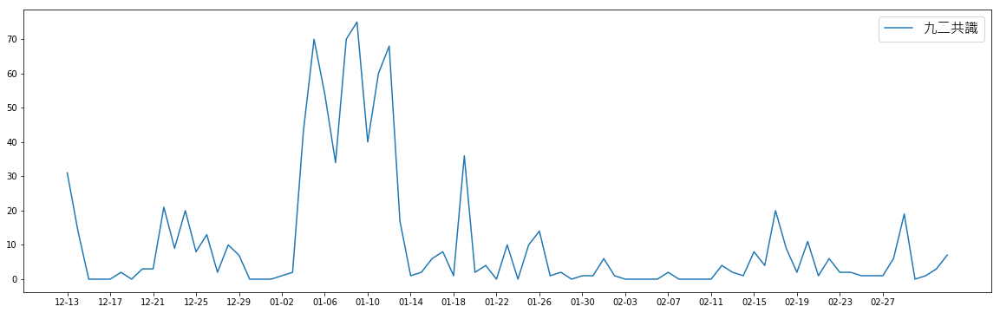

In [192]:
# word times
font = font_manager.FontProperties(fname='../msjh.ttc',
                               weight='bold',
                               style='normal', size=16)
plt.figure(figsize=(20,6))
plt.plot(aall_date, df.loc['九二共識']['2018-12-11':], label='九二共識')
plt.xticks(list(range(0, 80, 4)), [aall_date[80::-1][i] for i in range(0, 80, 4)])
plt.legend(prop=font)
plt.show()

# 修改 code     

plt.xticks(list(range(0, date_length, date_int)), [aall_date[from_index:to_index][i] for i in range(0, date_length, date_int)])

## 修改成

plt.xticks(list(range(0, date_length, date_int)), [aall_date[date_length::-1][i] for i in range(0, date_length, date_int)])

## 這樣圖中顯示的時間軸才會是正確的 

In [195]:
def plot_tfdf_of_word(word, df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03'):
    from_index = df_tf.columns.get_loc(date_from)
    to_index = df_tf.columns.get_loc(date_to)+1
    date_length = to_index-from_index
    date_int = date_length//25
    font = font_manager.FontProperties(fname='../msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)
    
    plt.plot(all_date[from_index:to_index], 
             df_tf.loc[word][date_from:date_to]*df_occur.loc[word][date_from:date_to], '-o', label=word)
    plt.legend(prop=font)
    plt.xticks(list(range(0, date_length, date_int)), [aall_date[date_length::-1][i] for i in range(0, date_length, date_int)])

In [164]:
df_tf.columns.get_loc('2019-03-03')

82

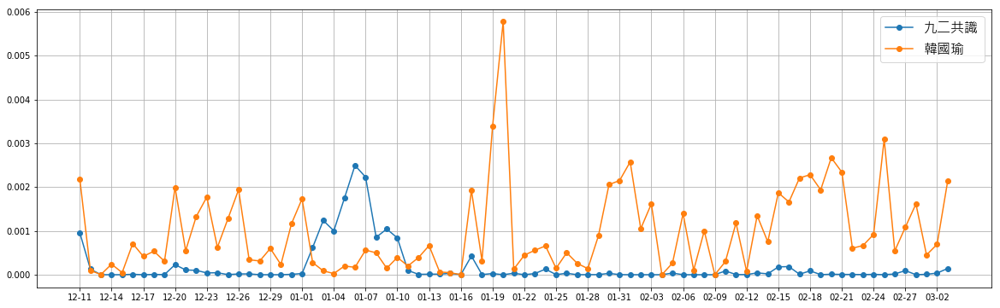

In [196]:
plt.figure(figsize=(20,6))

plot_tfdf_of_word('九二共識', df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03')
plot_tfdf_of_word('韓國瑜', df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03')

plt.grid()
plt.show()

In [197]:
def get_high_tfdf_date(word, df_tf, df_occur):
    tfdf = get_tfdf(word, df_tf, df_occur)
    m = statistics.mean(tfdf)
    s = statistics.stdev(tfdf)
    tfdf_bool = [x > m+s for x in tfdf]
    tfdf_date = {all_date[x[0]]: tfdf[x[0]] for x in list(filter(lambda e: e[1], enumerate(tfdf_bool)))}
    return tfdf_date

def draw_event(event, i, df_tf, df_occur):
    event_date = get_high_tfdf_date(event, df_tf, df_occur)
    date_index = [all_date.index(x) for x in event_date.keys()]
    plt.scatter(date_index, [i for x in date_index], s=[x*100000 for x in list(event_date.values())])

In [246]:
event_high_tfdf_dict = {e: get_high_tfdf_date(e, df_tf, df_occur) for e in events}
with open('../data/event_high_tfdf_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(event_high_tfdf_dict, j)

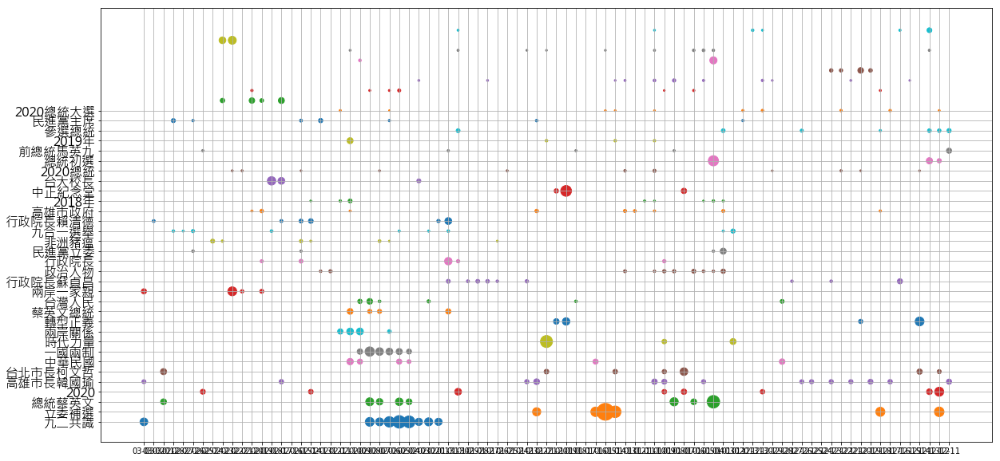

In [202]:
plt.figure(figsize=(20, 10))
for (i, e) in enumerate(events):
    draw_event(e, i, df_tf, df_occur)
plt.xticks(range(0, 83), aall_date)

plt.yticks(range(0, 32), events, fontproperties=font)

plt.grid()
plt.show()

In [203]:

# each event with tfdf of related people
event_people_dict = {}
for event in events:
    event_data = data_containing_keyword(event, data)
    # event_data[0]
    name_times_of_date = {}
    for date in all_date:
        oneday_data = list(filter(lambda data: data['date']==date, event_data))
        oneday_dict = [news['cutted_dict'] for news in oneday_data]
        current_word_dict = merge_one_day_news_dict(oneday_dict, 'wt', divide=len(oneday_data))
        possible_name = first_n_words(current_word_dict, 10000, 3, 3)
        name_times_of_date[date]= list(filter(lambda x: x[0] in names, possible_name))

    all_names = set([name for name_list in name_times_of_date.values() for (name, times) in name_list])
    event_people_dict[event] = {name: [dict(name_times_of_date[date]).get(name, 0) for date in all_date] for name in all_names}
    
with open('../data/event_people_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(event_people_dict, j)

In [204]:
pd.DataFrame(event_people_dict).T.head(3)

,12月,交通部,何志偉,促轉會,候選人,卓榮泰,台北市,吳敦義,國民黨,基金會,...,鄭文燦,鄭麗君,陳其邁,陳思宇,陳水扁,韓國瑜,馬英九,高雄市,黃國昌,黨主席
九二共識,"[0.08333333333333333, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.08333333333333...","[0, 0.1, 0, 0, 0, 0, 0, 0, 1.0, 0.083333333333...","[0, 0, 0, 0, 0, 0, 0, 0, 16.0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.75, 0.1428571428...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0.30000000000000004, 0, 0, 0, 0, 0, 0.5, 0...","[0, 0.2, 0, 0, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, 0...",...,"[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.33...","[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.75, 0.1, 0, 0, 0, 0, 0, 1.0, 0, 0.166666666...","[0, 0, 0, 0, 0, 0, 0, 3.5, 0, 1.08333333333333...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0.6, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0,..."
立委補選,"[0, 0.11764705882352941, 0, 0, 0, 0.625, 0.5, ...","[0, 0.1764705882352941, 0, 0, 0, 1.0, 0, 0, 0,...","[0.5, 0.47058823529411764, 1.0, 1.5, 2.8000000...","[0, 0, 0, 0, 0, 0, 0, 0.14285714285714285, 0, ...","[0.16666666666666666, 0.058823529411764705, 0....","[0, 0, 0, 0.4, 0, 0, 3.75, 0.14285714285714285...","[0.6666666666666666, 0.5882352941176471, 0.4, ...","[0, 0.17647058823529413, 0, 0, 0, 0, 0, 0, 0, ...","[2.8333333333333335, 1.3529411764705883, 0, 1....","[0, 0, 0, 0, 0, 0, 0, 0.2857142857142857, 0, 0...",...,"[0.16666666666666666, 0.29411764705882354, 0.6...","[0, 0.058823529411764705, 0, 0, 0, 0, 0.25, 0....","[0, 0.058823529411764705, 0, 0.1, 0, 0, 0, 0, ...","[3.4999999999999996, 0.588235294117647, 2.6, 2...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0.30000000000000004, 0, 0, 0, 0.4285...","[0, 0, 0, 0, 0, 0.125, 2.0, 1.4285714285714286...","[0, 0.11764705882352941, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0.2, 0.7999999999999999, 0, 0, 0, 0.142...","[0.16666666666666666, 0.35294117647058826, 0.2..."
總統蔡英文,"[0, 0.07692307692307693, 0, 0.2222222222222222...","[1.0, 0.23076923076923078, 0, 0, 0, 0, 0, 0.13...","[0, 0, 0.0625, 0, 0, 0, 0.2, 0, 0, 0, 0, 0, 0,...","[0, 0, 0, 0, 0, 0, 0, 1.1333333333333333, 0, 0...","[0, 0.07692307692307693, 0, 0.1111111111111111...","[0, 0, 0, 2.3333333333333335, 0, 1.66666666666...","[0, 0.15384615384615385, 0.4375, 0, 0, 0, 0, 0...","[0, 0.07692307692307693, 0, 0.5555555555555556...","[0, 0.6153846153846154, 0.125, 1.1111111111111...","[0, 0.07692307692307693, 0, 0.1111111111111111...",...,"[0, 0.07692307692307693, 0.125, 1.666666666666...","[0, 0, 0, 0.1111111111111111, 0, 0, 1.0, 0, 0,...","[0.25, 0, 0, 0.4444444444444444, 0, 0.33333333...","[0, 0, 0.25, 0.1111111111111111, 0.33333333333...","[0, 0.07692307692307693, 0, 0.2222222222222222...","[1.5, 0.38461538461538464, 0, 0, 0, 0.33333333...","[0.25, 0, 0, 0.5555555555555556, 0, 0.16666666...","[0, 0, 0, 0, 0, 0, 0, 0.06666666666666667, 0, ...","[0, 0, 0.0625, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0.25, 0.38461538461538464, 0, 1.3333333333333..."


In [247]:
people_tfdf_dict = {name: list(get_tfdf(name, df_tf, df_occur)) for name in names}
with open('../data/people_tfdf_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(people_tfdf_dict, j)

In [248]:
pd.DataFrame(people_tfdf_dict, index=aall_date).T.head(4)

,03-03,03-02,03-01,02-28,02-27,02-26,02-25,02-24,02-23,02-22,...,12-20,12-19,12-18,12-17,12-16,12-15,12-14,12-13,12-12,12-11
民進黨,0.000903,0.005374,0.001922,0.010278,0.003469,0.001674,0.002820,0.001428,0.000442,0.000283,...,0.001287,0.001300,0.000920,0.000461,0.001677,0.000999,0.000095,0.000282,0.001123,0.000153
柯文哲,0.000167,0.000318,0.002924,0.000655,0.002397,0.000627,0.000419,0.000971,0.000571,0.002386,...,0.002216,0.000816,0.000000,0.000918,0.000863,0.001347,0.004615,0.000122,0.001487,0.000407
韓國瑜,0.002188,0.000095,0.000004,0.000241,0.000047,0.000710,0.000419,0.000536,0.000307,0.001992,...,0.000604,0.000666,0.000920,0.003094,0.000542,0.001085,0.001615,0.000451,0.000694,0.002138
國民黨,0.000450,0.001234,0.000772,0.000796,0.000252,0.000664,0.001395,0.000703,0.000072,0.000434,...,0.001963,0.002473,0.001238,0.000539,0.001455,0.001857,0.000435,0.001728,0.001450,0.002138


In [250]:
test = json.loads(open('../data/people_tfdf_dict.json').read())
print(test)

{'柯文哲': [0.0001774622892635315, 0.00021972078558631645, 0.0005456588027603917, 0.0, 0.00028557394651771133, 6.069213308570942e-06, 0.00023407196040839986, 0.0007321122746466906, 0.00022065313327449248, 0.00010860711376595167, 0.0014189810737282994, 0.005777550855883697, 0.00016845597144023375, 2.2260250149561056e-05, 0.00016105091087711008, 0.0013647876049289831, 0.003634561374525031, 0.0014463653689082495, 0.0012216491907909733, 0.0005150290378276566, 0.00011431510959961132, 0.0020979020979020975, 0.00019305592681695326, 0.000952567730367299, 0.00022011886418666079, 0.0013165318788790673, 0.00034565565419880656, 0.00022417943321834796, 0.0004042854255104103, 0.0002446662752006263, 0.0008024072216649949, 0.001790830945558739, 0.00010318320177475106, 0.00018974260512079151, 0.00039742419443978714, 0.00040470010326830214, 0.0005693158832433591, 0.0006240898689411276, 0.00029416090601559053, 0.0003247825916530874, 0.000656526972316446, 7.095061206728011e-05, 0.0009368216611447503, 0.00067

# visualization

In [260]:
# import packages
import math
import numpy as np
import plotly.plotly as py
import plotly.graph_objs as go
import ipywidgets as widgets
from IPython.display import clear_output
from datetime import datetime, timedelta
import json
import plotly
plotly.tools.set_credentials_file(username='jeff20628m', api_key='ledmpdJLKh2TTY5fU60O')

### Section I 政治事件網路聲量分析¶


In [255]:
def get_scatter_trace(points_x, points_y, points_size=10, trace_name='', line=False):
    if line:
        return go.Scatter(
            x = points_x,
            y = points_y,
            mode = 'lines',
            hoverinfo = 'x+y',
            name
            = trace_name,
            text = points_size,
            yaxis = 'y2',
            line = {
                "color": 'rgba(255, 166, 87, 0.4)'
            }
        )
    else:
        return go.Scatter(
            x = points_x,
            y = points_y,
            mode = 'markers' if not line else 'lines',
            marker = {
                'size': points_size
            },
            hoverinfo = 'text+name',
            name = trace_name,
            text = points_size
        )

In [256]:
events = json.loads(open('../data/event_high_tfdf_dict_headnews.json').read())

In [261]:
def sectionI_plot(ori_data, title=''):
    
    # data
    fig_data = []
    for index, name in enumerate(ori_data):
        x, y, size = [], [], []
        for date, tfdf_val in ori_data[name].items():
            x.append(datetime.strptime(date, "%Y-%m-%d"))
            y.append(len(ori_data) - index)
            size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
        fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='Event'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)
    display(py.iplot(fig, filename='bubble-event'))

In [262]:
sectionI_plot(events)

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~jeff20628m/0 or inside your plot.ly account where it is named 'bubble-event'


C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



###  Section II 事件相關人聲量分析

In [264]:
event_people_relation = json.loads(open('../data/event_people_dict_headnews.json').read())

In [265]:
event_people_relation

{'九二共識': {'總統府': [0,
   0.8,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.08333333333333333,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.5,
   0.05263157894736842,
   0.3214285714285714,
   0.1111111111111111,
   0.14285714285714285,
   0,
   0.041666666666666664,
   0.15789473684210525,
   0,
   0.06666666666666667,
   0,
   0,
   0,
   0,
   0.3333333333333333,
   0,
   1.0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.2,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.3333333333333333,
   0,
   0,
   0,
   0,
   0,
   0,
   0.2,
   0,
   0,
   0,
   0],
  '新北市': [0,
   0.2,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.08333333333333333,
   0,
   0,
   0,
   0,
   0,
   0,
   0.5,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0.1111111111111111,
   0,
   0.09090909090909091,
   0.125,
   0.05263157894736842,
   0,
   0.26666666666666666,
   0,
   

In [266]:
def sectionII_plot(event_name, ori_data, selector_widget, start_date='2018-12-11', title=''):
    start_date = datetime.strptime(start_date, "%Y-%m-%d")
    
    # data
    fig_data = []
    x, y, size = [], [], []
    for date, tfdf_val in events[event_name].items():
        x.append(datetime.strptime(date, "%Y-%m-%d"))
        y.append(len(ori_data) + 1)
        size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
    fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=event_name))
        
    for index, name in enumerate(ori_data):
        x, y, size = [], [], []
        for day_index, tfdf_val in enumerate(ori_data[name]):
            if tfdf_val != 0:
                x.append(start_date + timedelta(days=day_index))
                y.append(len(ori_data) - index)
                size.append(max(math.log(round(tfdf_val, 2))*10,0)) ## constants need change
        fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='People'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)

    clear_output()
    display(selector_widget)
    display(py.iplot(fig, filename='event-people'))

In [267]:
event_selector = widgets.Dropdown(
    options=list(events.keys()),
    description='政治事件：'
)
display(event_selector)

def event_change(change):
    top_10_related_people = dict(sorted(event_people_relation[change['new']].items(), key=lambda x: sum(x[1]), reverse=True)[:10])
    sectionII_plot(change['new'], top_10_related_people, event_selector, title=change['new'])

event_change({'new': list(events.keys())[0]})
    
event_selector.observe(event_change, names='value')

Dropdown(description='政治事件：', index=3, options=('九二共識', '立委補選', '總統蔡英文', '2020', '高雄市長韓國瑜', '台北市長柯文哲', '中華民國',…

### Section III 人物聲量與事件疊圖分析¶


In [268]:
people = json.loads(open('../data/people_tfdf_dict_headnews.json').read())

In [269]:
people

{'民進黨': [0.0009033632910219586,
  0.005374388595438828,
  0.0019220923663583077,
  0.010277772035364082,
  0.003469429594234438,
  0.001673767498478393,
  0.002819775045775569,
  0.0014280198653430153,
  0.00044228834040592024,
  0.00028275512949728875,
  0.0006036092739147929,
  0.0013827984851504883,
  0.002121244261276686,
  0.0010830973107910085,
  0.0007475856425316962,
  0.0031068431245965143,
  0.0023619998536454473,
  0.0009160400895557202,
  0.00366695427092321,
  0.002313475997686524,
  0.00042178075836180355,
  0.0011759366232051496,
  0.0006572801382722661,
  0.002475813449982886,
  0.002598463194624892,
  0.0050158762750518796,
  0.005170671020915949,
  0.0025642548809948107,
  0.0007362547082141786,
  0.0018792997371217626,
  0.00038270848970884525,
  0.0018838652482269505,
  0.001563314226159458,
  0.00016916674612377472,
  0.0013317549570878951,
  0.000705684895800221,
  0.0011668214175177961,
  0.000727066700560541,
  0.0006580521655898539,
  0.0006052495309316136,
  0

In [270]:
def sectionIII_plot(people_data, events_data, selector_widget, start_date='2018-12-11', title=''):
    start_date = datetime.strptime(start_date, "%Y-%m-%d")
    
    fig_data = []
    
    # people data
    x, y = [], []
    for day_index, value in enumerate(people_data['tfdf']):
        x.append(start_date + timedelta(days=day_index))
        y.append(value)
    fig_data.append(get_scatter_trace(x, y, line=True))
    
    # event data
    for index, name in enumerate(events_data):
        x, y, size = [], [], []
        for date, tfdf_val in events_data[name].items():
            x.append(datetime.strptime(date, "%Y-%m-%d"))
            y.append(len(events_data) - index)
            size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
        fig_data.append(get_scatter_trace(x, y, size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='Event'
        ),
        yaxis2=dict(
            title='People Reputation',
            titlefont=dict(
                color='rgb(148, 103, 189)'
            ),
            tickfont=dict(
                color='rgb(148, 103, 189)'
            ),
            overlaying='y',
            side='right'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)
    
    clear_output()
    display(selector_widget)
    display(py.iplot(fig, filename='person-events'))

In [271]:
people_selector = widgets.Dropdown(
    options=list(people.keys()),
    description='政治人物：'
)
display(people_selector)

def people_change(change):
    sectionIII_plot({
        'name': change['new'],
        'tfdf': people[change['new']]
    }, events, people_selector, title='人物與事件聲量圖({})'.format(change['new']))

people_change({'new': list(people.keys())[0]})
    
people_selector.observe(people_change, names='value')

Dropdown(description='政治人物：', options=('民進黨', '柯文哲', '韓國瑜', '國民黨', '蔡英文', '蘇貞昌', '行政院', '賴清德', '王金平', '吳敦義', '…